Term Project Olivier Girard

Contaminated Sites and How They Still Affect Montreal

Import the needed programs

In [3]:
import pandas as pd
import geopandas as gpd
import matplotlib
from glob import glob
from shapely.geometry import Point
import pyproj
import matplotlib.pyplot as plt

Import the Social Deprevation Data

In [4]:
gjsonFiles = glob('MTLCity.geojson')
gdf_dep = gpd.read_file(gjsonFiles[0])

gdf_dep.columns

Index(['ADIDU', 'ADIDU_D', 'AD', 'AD_1', 'ADPOP2016', 'RSS', 'ZONE', 'NOTEMAT',
       'NOTESOC', 'QuintMat', 'QuintSoc', 'QuintMatRS', 'QuintSocRS',
       'QuartMatRS', 'QuartSocRS', 'ADIDU_1', 'Com', 'Com3', 'ComRSS',
       'Com3RSS', 'RTS', 'QuintMatRT', 'QuintSocRT', 'QuartMatRT',
       'QuartSocRT', 'ComRTS', 'Com3RTS', 'RLS', 'QuartMatRL', 'QuartSocRL',
       'QuintMatRL', 'QuintSocRL', 'ComRLS', 'Com3RLS', 'CLSC', 'FRAC_CLSC',
       'QuartMatCL', 'QuartSocCL', 'QuintMatCL', 'QuintSocCL', 'ComCLSC',
       'Com3CLSC', 'SDRIDU', 'SDRNOM', 'SDRGENRE', 'CSSCODE', 'CSSGENRE',
       'CentMat', 'CentSoc', 'geometry'],
      dtype='object')

In [5]:
gdf_dep.explore(column="QuintMat", cmap="Reds", legend=None, tiles='cartodbpositron', tooltip=['ADPOP2016','QuintMat','QuintSoc'], style_kwds={"color": "black", "weight":1, "opacity":0.76})

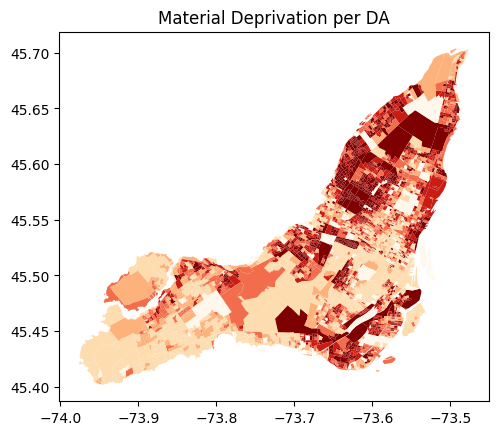

In [6]:
gdf_dep.plot(column = 'QuintMat',cmap='OrRd')
plt.title('Material Deprivation per DA')
plt.show()

Import the Contamination Site Data

In [7]:
df_quebec = pd.read_csv("Quebecsites.csv", header = [0])
df_quebec.head()

,\nNom du Dossier/ Numero de la fiche,LatLong,MRC,Eau Souterraine,Sol,etat,Date de creation ou date de mise a jour
0,"Parc non-amenage, 5e Rue",45.6553015211\n? -73.5587954425,Ville de Montreal,NaN,"Cuivre (Cu), Hydrocarbures aromatiques polycyc...",R : Non terminee,10/27/20
1,"Parc non-amenage, boul. Gouin",45.6699\n? -73.5471,Ville de Montreal,NaN,"Arsenic (As), Hydrocarbures aromatiques polycy...",R : Non terminee,10/27/20
2,"""Le Cours Chaboillez"" Secteur 1",45.4938888889\n? -73.5647222222,Ville de Montreal,NaN,"Baryum (Ba), Benzene (pot), Benzo(a)anthracene...",R : Terminee en 2005\nQ : > B (Total),10/15/13
3,"""Le Cours Chaboillez"" Secteur 2",45.4944444444\n? -73.5661111111,Ville de Montreal,NaN,"Hydrocarbures aromatiques polycycliques*, Hydr...",R : Terminee en 2007\nQ : > C,2/29/08
4,"""Le Cours Chaboillez"" Secteur 3",45.4955555556\n? -73.565,Ville de Montreal,NaN,"Acenaphtene, Benzo(a)anthracene, Benzo(a)pyren...",R : Non terminee,10/15/13


Add geometry to the data

In [8]:
locations = df_quebec['LatLong'].str.split('?', expand=True)
locations.head()
result = pd.concat([df_quebec,locations], axis=1)
result.rename({0: 'Latitude', 1: 'Longitude'}, axis='columns', inplace=True) 
result['Latitude'] = result['Latitude'].str.replace('\n', '')
gdf = gpd.GeoDataFrame(result, geometry=[Point(x, y) for x, y in zip(result['Longitude'], result['Latitude'])])

gdf.head()

,\nNom du Dossier/ Numero de la fiche,LatLong,MRC,Eau Souterraine,Sol,etat,Date de creation ou date de mise a jour,Latitude,Longitude,geometry
0,"Parc non-amenage, 5e Rue",45.6553015211\n? -73.5587954425,Ville de Montreal,NaN,"Cuivre (Cu), Hydrocarbures aromatiques polycyc...",R : Non terminee,10/27/20,45.6553015211,-73.5587954425,POINT (-73.55880 45.65530)
1,"Parc non-amenage, boul. Gouin",45.6699\n? -73.5471,Ville de Montreal,NaN,"Arsenic (As), Hydrocarbures aromatiques polycy...",R : Non terminee,10/27/20,45.6699,-73.5471,POINT (-73.54710 45.66990)
2,"""Le Cours Chaboillez"" Secteur 1",45.4938888889\n? -73.5647222222,Ville de Montreal,NaN,"Baryum (Ba), Benzene (pot), Benzo(a)anthracene...",R : Terminee en 2005\nQ : > B (Total),10/15/13,45.4938888889,-73.5647222222,POINT (-73.56472 45.49389)
3,"""Le Cours Chaboillez"" Secteur 2",45.4944444444\n? -73.5661111111,Ville de Montreal,NaN,"Hydrocarbures aromatiques polycycliques*, Hydr...",R : Terminee en 2007\nQ : > C,2/29/08,45.4944444444,-73.5661111111,POINT (-73.56611 45.49444)
4,"""Le Cours Chaboillez"" Secteur 3",45.4955555556\n? -73.565,Ville de Montreal,NaN,"Acenaphtene, Benzo(a)anthracene, Benzo(a)pyren...",R : Non terminee,10/15/13,45.4955555556,-73.565,POINT (-73.56500 45.49556)


Project the data to match Social Deprivation

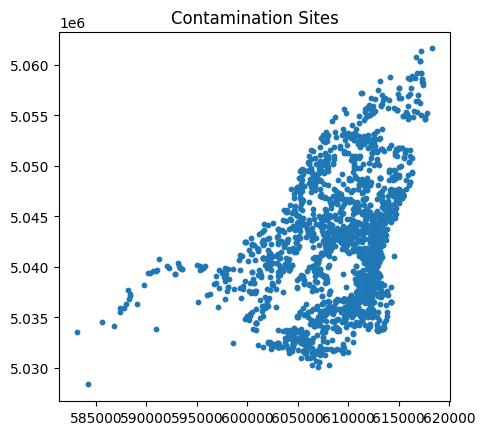

In [9]:

proj = pyproj.Proj(proj='utm', zone='18', ellps='WGS84', preserve_units=True)


gdf['x'], gdf['y'] = proj(gdf['Longitude'].values, gdf['Latitude'].values)


gdf_points = gpd.GeoDataFrame(gdf, geometry=gpd.points_from_xy(gdf['x'], gdf['y']), crs=proj.srs)


ax = gdf_points.plot(markersize=10)
ax.set_aspect('equal')
plt.title('Contamination Sites')
plt.show()

In [10]:
print(gdf_dep.crs) 
print(gdf.crs) 

gdf_dep = gdf_dep.to_crs(gdf.crs)

print(gdf_dep.crs) 
print(gdf.crs) 

EPSG:4326
None
EPSG:4326
EPSG:4326


Plot them on top of each other

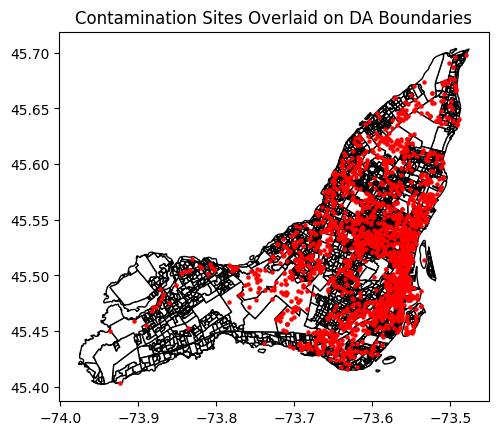

In [21]:
base = gdf_dep.plot(color='white', edgecolor='black')

gdf.plot(ax=base, marker='o', color='red', markersize=5);


plt.title('Contamination Sites Overlaid on DA Boundaries')
plt.show()

Find total amount of Contaminated Sites

In [22]:
row_count = len(gdf)
print(row_count)

2086


Join them to find the amount of contaminated sites in each DA

In [23]:
joined = gpd.sjoin(gdf, gdf_dep, op='within')
pd.set_option("display.max_columns", None)


counts = joined.groupby('ADIDU').size().reset_index(name='num_points')

gdf_joinedda = gdf_dep.merge(counts, on='ADIDU')
gdf_joinedda.head()

/Users/oliviergirard/Desktop/geog464/term-project-OGirard4/venv3.11.1/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,ADIDU,ADIDU_D,AD,AD_1,ADPOP2016,RSS,ZONE,NOTEMAT,NOTESOC,QuintMat,QuintSoc,QuintMatRS,QuintSocRS,QuartMatRS,QuartSocRS,ADIDU_1,Com,Com3,ComRSS,Com3RSS,RTS,QuintMatRT,QuintSocRT,QuartMatRT,QuartSocRT,ComRTS,Com3RTS,RLS,QuartMatRL,QuartSocRL,QuintMatRL,QuintSocRL,ComRLS,Com3RLS,CLSC,FRAC_CLSC,QuartMatCL,QuartSocCL,QuintMatCL,QuintSocCL,ComCLSC,Com3CLSC,SDRIDU,SDRNOM,SDRGENRE,CSSCODE,CSSGENRE,CentMat,CentSoc,geometry,num_points
0,24661006,24661006.0,24661006.0,24661006,301,6,1,0.038459,0.058711,5,5,4,5,3,3,24661006,C5,T5,C5,T5,63,5,4,3,3,C5,T5,631,3,3,5,4,C5,T5,6312,100,2,3,4,5,C5,T5,2466023,Montréal,V,462,1,83,92,"MULTIPOLYGON (((-73.59641 45.45366, -73.59547 ...",1
1,24661015,24661015.0,24661015.0,24661015,314,6,1,0.091349,0.024274,5,4,5,3,3,2,24661015,C5,T5,C4,T5,63,5,2,3,2,C4,T4,631,3,2,5,2,C4,T4,6312,100,3,2,5,3,C4,T5,2466023,Montréal,V,462,1,98,73,"MULTIPOLYGON (((-73.59641 45.45366, -73.59764 ...",1
2,24661018,24661018.0,24661018.0,24661018,755,6,1,0.046963,0.012673,5,4,5,3,3,2,24661018,C5,T5,C4,T5,63,5,1,3,1,C4,T3,631,3,1,5,1,C4,T3,6312,100,3,1,5,2,C4,T4,2466023,Montréal,V,462,1,87,64,"MULTIPOLYGON (((-73.58934 45.45385, -73.58937 ...",2
3,24661023,24661023.0,24661023.0,24661023,482,6,1,-0.011671,0.032256,3,4,3,4,2,2,24661023,C3,T4,C3,T4,63,3,2,2,2,C2,T2,631,2,2,3,3,C2,T3,6312,100,1,2,1,4,C3,T2,2466023,Montréal,V,462,1,41,78,"MULTIPOLYGON (((-73.58218 45.45767, -73.58223 ...",1
4,24661026,24661026.0,24661026.0,24661026,705,6,1,-0.003488,0.020995,3,4,3,3,2,2,24661026,C3,T4,C2,T3,63,4,2,2,1,C4,T3,631,2,2,3,2,C2,T2,6312,100,1,2,1,2,C1,T1,2466023,Montréal,V,462,1,50,70,"MULTIPOLYGON (((-73.58555 45.46181, -73.58563 ...",2


Explore the density of contamiated sites per DA

In [24]:
gdf_joinedda.explore(column="num_points", cmap="Reds", legend=None, tiles='cartodbpositron', tooltip=['ADPOP2016','num_points','QuintMat','QuintSoc'], style_kwds={"color": "black", "weight":1, "opacity":0.76})

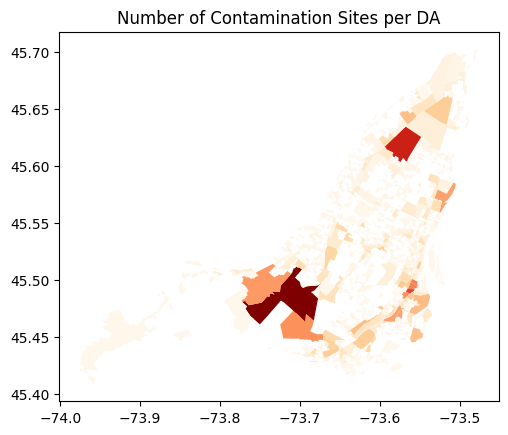

In [25]:
gdf_joinedda.plot(column = 'num_points',cmap='OrRd')
plt.title('Number of Contamination Sites per DA')
plt.show()

Import the CLSC Data

In [26]:
CLSCFile = glob('CLSCMTL.geojson')
gdf_CLSC = gpd.read_file(CLSCFile[0])

gdf_CLSC.head()

,CLSC_code,CLSC_nom,RLS_code,RTS_code,RSS_code,RUIS_code,Etiquette,Version,SHAPE_Leng,SHAPE_Area,geometry
0,06111,Lac Saint-Louis,0611,061,06,3,Lac Saint-Louis (06111),2022-07-01,53402.214413,1.065711e+08,"MULTIPOLYGON (((-73.79604 45.48310, -73.79470 ..."
1,06112,Pierrefonds,0611,061,06,3,Pierrefonds (06112),2022-07-01,49512.138445,7.036332e+07,"MULTIPOLYGON (((-73.86329 45.51985, -73.86329 ..."
2,06113,Dollard-des-Ormeaux,0611,061,06,3,Dollard-des-Ormeaux (06113),2022-07-01,21395.733359,1.510373e+07,"MULTIPOLYGON (((-73.84655 45.46257, -73.84674 ..."
3,06121,Lachine,0612,061,06,3,Lachine (06121),2022-07-01,42787.389218,5.185490e+07,"MULTIPOLYGON (((-73.76705 45.48917, -73.76704 ..."
4,06122,Lasalle,0612,061,06,3,Lasalle (06122),2022-07-01,25334.532918,2.527000e+07,"MULTIPOLYGON (((-73.59951 45.43752, -73.59920 ..."


Plot CLSC Data

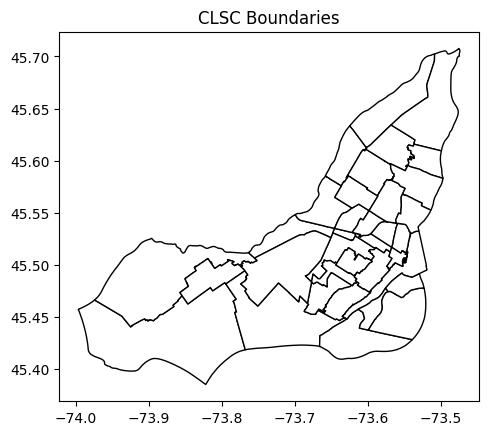

In [27]:
gdf_CLSC.plot(color='white', edgecolor='black')
plt.title('CLSC Boundaries')
plt.show()

Reproject CLSC Data

In [28]:
print(gdf_CLSC.crs) 
print(gdf.crs) 

gdf_CLSC = gdf_CLSC.to_crs(gdf.crs)

print(gdf_CLSC.crs) 
print(gdf.crs) 

EPSG:4326
EPSG:4326
EPSG:4326
EPSG:4326


Join to find the amount of contaminated sites in each CLSC

In [29]:
CLSC = gpd.sjoin(gdf,gdf_CLSC, op='within')
pd.set_option("display.max_columns", None)


CLSC = CLSC.groupby('CLSC_code').size().reset_index(name='num_points')

gdf_joinedCLSC = gdf_CLSC.merge(CLSC, on='CLSC_code')
gdf_joinedCLSC.head()

/Users/oliviergirard/Desktop/geog464/term-project-OGirard4/venv3.11.1/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


,CLSC_code,CLSC_nom,RLS_code,RTS_code,RSS_code,RUIS_code,Etiquette,Version,SHAPE_Leng,SHAPE_Area,geometry,num_points
0,06111,Lac Saint-Louis,0611,061,06,3,Lac Saint-Louis (06111),2022-07-01,53402.214413,1.065711e+08,"MULTIPOLYGON (((-73.79604 45.48310, -73.79470 ...",3
1,06112,Pierrefonds,0611,061,06,3,Pierrefonds (06112),2022-07-01,49512.138445,7.036332e+07,"MULTIPOLYGON (((-73.86329 45.51985, -73.86329 ...",35
2,06121,Lachine,0612,061,06,3,Lachine (06121),2022-07-01,42787.389218,5.185490e+07,"MULTIPOLYGON (((-73.76705 45.48917, -73.76704 ...",110
3,06122,Lasalle,0612,061,06,3,Lasalle (06122),2022-07-01,25334.532918,2.527000e+07,"MULTIPOLYGON (((-73.59951 45.43752, -73.59920 ...",84
4,06211,Côte-Saint-Luc,0621,062,06,3,Côte-Saint-Luc (06211),2022-07-01,17330.568144,9.577411e+06,"MULTIPOLYGON (((-73.64903 45.49205, -73.64856 ...",7


In [ ]:
Explore Contaminated Sites density

In [30]:
gdf_joinedCLSC.explore(column="num_points", cmap="Reds", legend=None, tiles='cartodbpositron', tooltip=['CLSC_nom','num_points'], style_kwds={"color": "black", "weight":1, "opacity":0.76})

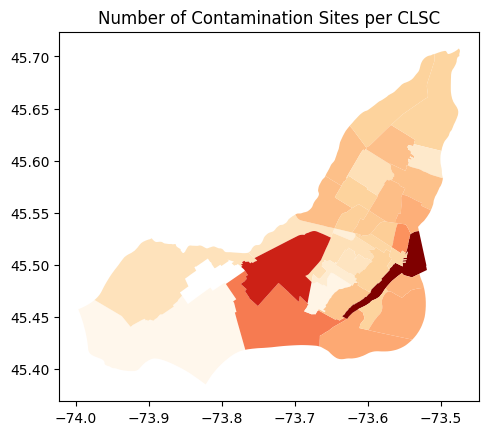

In [31]:
gdf_joinedCLSC.plot(column = 'num_points',cmap='OrRd')
plt.title('Number of Contamination Sites per CLSC')
plt.show()

(array([4., 6., 9., 8., 4., 1., 0., 1., 0., 1.]),
 array([  3. ,  22.2,  41.4,  60.6,  79.8,  99. , 118.2, 137.4, 156.6,
        175.8, 195. ]),
 <BarContainer object of 10 artists>)

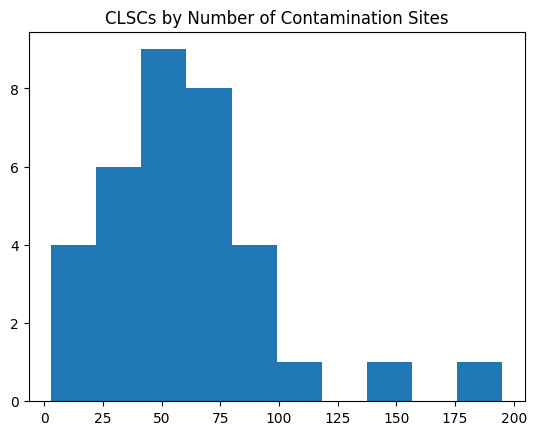

In [32]:
fig, ax = matplotlib.pyplot.subplots()
ax.set_title('CLSCs by Number of Contamination Sites')
ax.hist(gdf_joinedCLSC['num_points'])

Sources: https://www.donneesquebec.ca/recherche/dataset/limites-territoriales
https://www.environnement.gouv.qc.ca/sol/terrains/terrains-contamines/resultats.asp
https://geopandas.org/en/stable/index.html
https://www.donneesquebec.ca/recherche/dataset/indice-de-defavorisation-du-quebec-2016/resource/279bca78-1279-486c-9dd8-1684e7cef731
